## A 2-stage LSBG classification in Y6

In this notebook we develop a 2-stage classification process for separation of LSBGs from artifacts in Y6 data.

Our primary goal is to minimize the number of false negatives (i.e. be as complete as possible in our selection) and secondary to maximize true positives, so completeness is overall favored over purity.

---
**Let's briefly describe the two stages:**

- First stage: In this stage we use as a training set the 7 visually inspected regions from DES Y3, a highly-imbalanced (more artifacts than LSBGs) dataset, that we supplement with the SMUDGES LSBGs. These LSBGs are very faint and thus may help the training in a regime where many objects are artifacts.


- Second stage: In this stage we use the LSBGs and visually rejected artifacts from DES Y3 (20k+20k, the dataset used in "DeepShadows") to reclassify those that were classified as LSBGs in the first step, since we know that many of these will be artifacts ($\sim 50\%$) in Y3. Again, the objective is to keep the false negatives as low as possible (provided that we do not produce an extremely non-pure sample).


In [142]:
# Import basic packages
import numpy as np
import scipy as sp
import pandas as pd
from astropy.io import fits

# ==== Scikit-learn =======================
# Preprocessing
from sklearn.preprocessing import StandardScaler #Standar scaler for standardization
from sklearn.model_selection import train_test_split # For random split

# Model selection
from sklearn.model_selection import GridSearchCV

# Classifiers
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

# Metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

# ==========================================
# Matplotlib, urlib etc 
import urllib
import urllib.request
import matplotlib
import matplotlib.pyplot as plt
from IPython.display import clear_output, display
from PIL import Image
%matplotlib inline
# =========================================
# =========================================
# Adjust rc parameters to make plots pretty
def plot_pretty(dpi=200, fontsize=9):
    
    import matplotlib.pyplot as plt

    plt.rc("savefig", dpi=dpi)       # dpi resolution of saved image files
    # if you have LaTeX installed on your laptop, uncomment the line below for prettier labels
    #plt.rc('text', usetex=True)      # use LaTeX to process labels
    plt.rc('font', size=fontsize)    # fontsize
    plt.rc('xtick', direction='in')  # make axes ticks point inward
    plt.rc('ytick', direction='in')
    plt.rc('xtick.major', pad=10) 
    plt.rc('xtick.minor', pad=5)
    plt.rc('ytick.major', pad=10) 
    plt.rc('ytick.minor', pad=5)
    plt.rc('lines', dotted_pattern = [0.5, 1.1]) # fix dotted lines

    return
plot_pretty()

**Helper functions**

Write a function that creates and plots 100 cutouts of objects , given their coordinates

In [143]:
def cutout_plot(ra_arr,dec_arr,numb,end=100,save=True):
    """
    This function gets the coordinates (ra,dec) of 
    a number of objects and outputs a figure with 100 cutouts
    
    Inputs:
    ra_arr - 1D array of RAs
    dec_arr - 1D array of DECs
    numb - where to start from creating the cutouts
    if 0, gives you the first 100 objects; if 100 gives you the next 100 etc
    save - whether to save the image or not, defualt = True
    """
    # Initialize array
    Array = np.zeros([end,64,64,3])
    
    zoom=15
    
    # Populate array
    for i in range(end):
        j = i + numb
        # Give a name to the figure. Name them as "Image_cand_(i).jpb
        # Where i is the number of the candidate
        # This is easy to change to ra, dec or coadd ID or whatever...
        fig_name = "Image_cand.jpg"
    
        #Create now the name of the URL
        # This need to have as inputs (that change) the RA, DEC of each objec and zoom
        RA_loc = ra_arr[j] #The RA of the i-th object
        DEC_loc = dec_arr[j] # The DEC of the i-th object
    
        url_name = "http://legacysurvey.org//viewer/jpeg-cutout?ra={0}&dec={1}&zoom={2}&layer=des-dr1".format(RA_loc,DEC_loc,zoom)
        #url_name = "https://www.legacysurvey.org//viewer/jpeg-cutout?ra={0}&dec={1}&layer=hsc2&zoom={2}".format(RA_loc,DEC_loc,zoom)
        urllib.request.urlretrieve(url_name, fig_name) #Retrieves and saves each image
    
        image = Image.open('Image_cand.jpg')
        # resize image
        new_image = image.resize((64, 64))
        # Convert the image to an RGB array
        im_array = np.asarray(new_image)
    
        Array[i] = im_array
    
        clear_output(wait=True)
        print('runs:',i)
    
    # ==========================================
    # Plot the cutouts generated in an array
    n_rows = int(end/5)
    n_cols = 5
    
    plt.figure(figsize=(4*n_cols*0.7, 4*n_rows*0.7))

    for i in range(n_rows*n_cols):
        #if (i==3):
        #    plt.title("Matched objects",fontsize=25)
        plt.subplot(n_rows, n_cols, i+1)
        plt.imshow(Array[i]/255.)
        plt.axis('off')
    
    if (save==True):
        plt.savefig("Examples.pdf")

**Define function that selects all objects around an area**

This function selects all objects around a given area and returns coordinates and a feature matrix.

For example, in the area around Fornax

In [144]:
# Open DES Y6 Gold catalog
DES_Y6 = fits.open('y6_gold_2_0_lsb_skim.fits')

In [145]:
# Import full catalog with all the properties
data = DES_Y6[1].data[:]

# Import RA and DEC coordinates
ra = data['RA']
dec = data['DEC']

In [146]:
def feat_mat_around(ra_c,dec_c,degs=1.):
    """
    Function that returns arrays of coordinates 
    and a feature matrix to be used for classification,
    around given coordinates.
    -------------------------
    Input:
    ra_c - central coordinate/RA
    dec_c - central coordinate/DEC
    degs - how many degrees around the center to keep/default=1
    -------------------------
    Output:
    ras_in - coordinates of objects that pass the criteria/RA
    decs_in - coordinates of objects that pass the criteria/DECs
    X_feat - feature matrix (unnormalized) of the objects that pass the criteria
    """
    
    # Define box of coordinates
    box = (ra>(ra_c-degs))&(ra<(ra_c+degs))&(dec>(dec_c-degs))&(dec<(dec_c+degs))
    
    # Keep only coordinates & features within the above coordinate box
    ras_in = ra[box]
    decs_in = dec[box]
    data_in = data[box]
    
    
    # Get different properties
    A_IMAGE_in = data_in['A_IMAGE']
    B_IMAGE_in = data_in['B_IMAGE']
    MAG_AUTO_G_in = data_in['MAG_AUTO_G']
    FLUX_RADIUS_G_in = 0.263*data_in['FLUX_RADIUS_G']
    MU_EFF_MODEL_G_in = data_in['MU_EFF_MODEL_G']
    MU_MAX_G_in = data_in['MU_MAX_G']
    MU_MAX_MODEL_G_in = data_in['MU_MAX_MODEL_G']
    MU_MEAN_MODEL_G_in = data_in['MU_MEAN_MODEL_G']
    MAG_AUTO_R_in = data_in['MAG_AUTO_R']
    FLUX_RADIUS_R_in = 0.263*data_in['FLUX_RADIUS_R']
    MU_EFF_MODEL_R_in = data_in['MU_EFF_MODEL_R']
    MU_MAX_R_in = data_in['MU_MAX_R']
    MU_MAX_MODEL_R_in = data_in['MU_MAX_MODEL_R']
    MU_MEAN_MODEL_R_in = data_in['MU_MEAN_MODEL_R']
    MAG_AUTO_I_in = data_in['MAG_AUTO_I']
    FLUX_RADIUS_I_in = 0.263*data_in['FLUX_RADIUS_I']
    MU_EFF_MODEL_I_in = data_in['MU_EFF_MODEL_I']
    MU_MAX_I_in = data_in['MU_MAX_I']
    MU_MAX_MODEL_I_in = data_in['MU_MAX_MODEL_I']
    MU_MEAN_MODEL_I_in = data_in['MU_MEAN_MODEL_I']
    
    # =========== Create extra features ============
    # Ellipticity
    Ell_in = 1. - B_IMAGE_in/A_IMAGE_in
    
    # Colors
    col_g_r_in = MAG_AUTO_G_in - MAG_AUTO_R_in
    col_g_i_in = MAG_AUTO_G_in - MAG_AUTO_I_in
    col_r_i_in = MAG_AUTO_R_in - MAG_AUTO_I_in

    # ==============================================
    # ==============================================
    # ========= Create the feature matrix ==========
    
    # Length of matrix
    len_n = len(ras_in)
    
    # Initialize
    X_mat_in = np.zeros([len_n,19])
    
    # Populate
    # Ellipticity 
    X_mat_in[:,0] = Ell_in
    # Colors
    X_mat_in[:,1] = col_g_i_in
    X_mat_in[:,2] = col_g_r_in;
    X_mat_in[:,3] = col_r_i_in
    # Magnitudes
    X_mat_in[:,4] = MAG_AUTO_G_in
    X_mat_in[:,5] = MAG_AUTO_R_in
    X_mat_in[:,6] = MAG_AUTO_I_in
    # Flux radii
    X_mat_in[:,7] = FLUX_RADIUS_G_in
    X_mat_in[:,8] = FLUX_RADIUS_R_in
    X_mat_in[:,9] = FLUX_RADIUS_I_in
    # Peak (max) surface brightness
    X_mat_in[:,10] = MU_MAX_MODEL_G_in
    X_mat_in[:,11] = MU_MAX_MODEL_R_in
    X_mat_in[:,12] = MU_MAX_MODEL_I_in
    # Effective surface brightness
    X_mat_in[:,13] = MU_EFF_MODEL_G_in
    X_mat_in[:,14] = MU_EFF_MODEL_R_in
    X_mat_in[:,15] = MU_EFF_MODEL_I_in
    # Mean surface brightness 
    X_mat_in[:,16] = MU_MEAN_MODEL_G_in
    X_mat_in[:,17] = MU_MEAN_MODEL_R_in
    X_mat_in[:,18] = MU_MEAN_MODEL_I_in
    # ========================================
    # ========================================
    # Return coordinates and matrix
    return ras_in, decs_in, X_mat_in

Get coordinates and feature matrix in region of $\pm 1^o$ from the center of the Fornax cluster, that has coordinates:

\begin{equation}
RA = 54.6162,\,\, DEC = -35.4483
\end{equation}

In [147]:
# Coordinates of the center of Fornax
RA_f = 54.6162
DEC_f = -35.4483

# Get things
ras_fornax, decs_fornax, X_mat_fornax = feat_mat_around(RA_f,DEC_f,degs=2.)

print(len(ras_fornax))

6157


Get cooridnates of objects and the feature matrix around another region, one that is not included in the training set.

For example, 2 degrees around:

\begin{equation}
RA = 20,\,\, DEC = -30
\end{equation}

In [10]:
# r for random (region)
RA_r = 20.
DEC_r = -30.

# Get things
ras_r, decs_r, X_mat_r = feat_mat_around(RA_r,DEC_r,degs=2.)

print(len(ras_r))

4423


### I) First stage classifier

In this part we train a classifier (we can check SVMS, Random Forest) with the purpose of significantly reducing the number of candidates, using the 7-region dataset and SMUDGES LSBGs.

- Import 7-region Matrix

In [148]:
from Train_set_regions import supervised

y_regions, X_regions = supervised()
# Create just two classes here
y_regions[y_regions==2] = 0
y_regions[y_regions==3] = 1

- Import SMUDGES and create array of labels. Then concatenate the two arrays

In [149]:
from smudges import Feature_SMUDGES

X_smudges = Feature_SMUDGES()

len_sm = np.shape(X_smudges)[0]
print(len_sm)
y_smudges = np.ones(len_sm)

161


In [150]:
# Concatenate

# Create feature matrix of the first type
X_feat_1st = np.concatenate((X_regions,X_smudges))
y_label_1st = np.concatenate((y_regions,y_smudges))

In [154]:
# Split into train-test sets
X_train_1st, X_test_1st, y_train_1st, y_test_1st = train_test_split(
    X_feat_1st, y_label_1st, train_size = 0.75, random_state = 42)


# Standardize the two sets
scaler = StandardScaler().fit(X_train_1st)

X_train_1st = scaler.fit_transform(X_train_1st)
X_test_1st = scaler.fit_transform(X_test_1st)

**Select best 1st stage classifier**

We now try to train a classifier on the this (imbalanced) dataset and predict on the area around Fornax; then we will pass those positively classified through a second-stage classifier.


We compare SVM (kernalized) and Random Forests, algorithms that usually give the best performance when it comes to feature-based classification.

We tune the hyperparameters such us they maximize recall (completeness).


Note: because of the small size of the dataset, after selecting the hyperparameters, we put the test set back to the training set and we re-train the classifier; this guarantees that we will only make the results better.

#### Support Vector Machine classifier

We start by selecting a support vector machine classifier

In [19]:
svc_init = SVC(kernel='rbf') # Initialize Support Vector Machine

# Define Grid of Parameters
param_grid = {'C': [10,100,1e3,1e4,1e5],
              'gamma': [0.001, 0.01,0.1,1]}

grid = GridSearchCV(svc_init, param_grid,scoring='recall')
%time grid.fit(X_train_1st, y_train_1st)
print(grid.best_params_)

CPU times: user 3min 54s, sys: 2.97 s, total: 3min 57s
Wall time: 4min 51s
{'C': 100000.0, 'gamma': 0.01}


Now train the classifier with the best parameters obtained from the grid search above, which are:

`C` = 100


`gamma` = 0.01 

In [155]:
# Train the classifier here
svc_1st = SVC(C=1e2, kernel='rbf', gamma=0.01, class_weight='balanced')
svc_1st.fit(X_train_1st, y_train_1st)


# Predict on the test set
y_pred_1st = svc_1st.predict(X_test_1st)

Evaluate performance on the test set

In [156]:
print(precision_score(y_test_1st,y_pred_1st))
print(recall_score(y_test_1st,y_pred_1st))
print(balanced_accuracy_score(y_test_1st,y_pred_1st))

0.5295950155763239
0.8415841584158416
0.8783525064142165


As expected, the precision is low, but the recall and the balanced accuracy high.

Now re-train on the full dataset and predict on the true dataset around Fornax.

In [157]:
# Standardize the full dataset
scaler = StandardScaler().fit(X_feat_1st)
X_feat_1st_st = scaler.fit_transform(X_feat_1st)

# Fit on the full dataset
svc_1st.fit(X_feat_1st_st, y_label_1st)

# Standardize the Fornax dataset
X_forn_1st_st = scaler.fit_transform(X_mat_fornax)

# Predict on the Fornax dataset
y_forn_1s_pred = svc_1st.predict(X_forn_1st_st)

Visually inspect examples of predictions.

Let's see first how many are predicted to be LSBGs and how many artifacts

In [158]:
print("predicted LSBGs:", len(y_forn_1s_pred[y_forn_1s_pred==1]))
print("predicted artifacts:", len(y_forn_1s_pred[y_forn_1s_pred==0]))

predicted LSBGs: 1001
predicted artifacts: 5156


In [159]:
# Coordinates of them
# Positves (LSBGs)
ra_pos_1st = ras_fornax[y_forn_1s_pred==1]
dec_pos_1st = decs_fornax[y_forn_1s_pred==1]

# Negatives (artifacts)
ra_neg_1st = ras_fornax[y_forn_1s_pred==0]
dec_neg_1st = decs_fornax[y_forn_1s_pred==0]

runs: 99


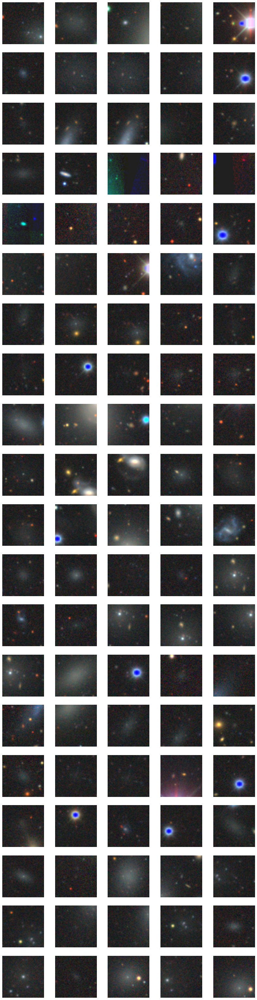

In [160]:
# Plot positives
cutout_plot(ra_pos_1st,dec_pos_1st,200,save=False)

runs: 99


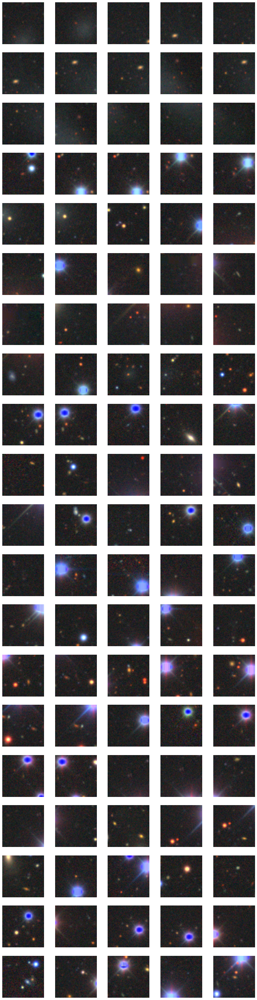

In [163]:
# Plot negatives
cutout_plot(ra_neg_1st,dec_neg_1st,500,save=False)

The results look very good, but we should keep in mind that the Fornax region was included in the original training set.

Now keep only those that are classified as positives.

In [46]:
X_forn_keep = X_mat_fornax[y_forn_1s_pred==1]
print(np.shape(X_forn_keep))

(181, 19)


**Second region**

In [112]:
# Standardize the Fornax dataset
X_r_1st_st = scaler.transform(X_mat_r)

# Predict on the Fornax dataset
y_r_1s_pred = svc_1st.predict(X_r_1st_st)

In [121]:
# Predict on the random dataset
y_r_1s_pred = svc_1st.predict(X_r_1st_st)

# Coordinates of them
# Positves (LSBGs)
ra_pos_1st_r = ras_r[y_r_1s_pred==1]
dec_pos_1st_r = decs_r[y_r_1s_pred==1]

# Negatives (artifacts)
ra_neg_1st_r = ras_r[y_r_1s_pred==0]
dec_neg_1st_r = decs_r[y_r_1s_pred==0]

print(len(ra_pos_1st_r))

18


runs: 14


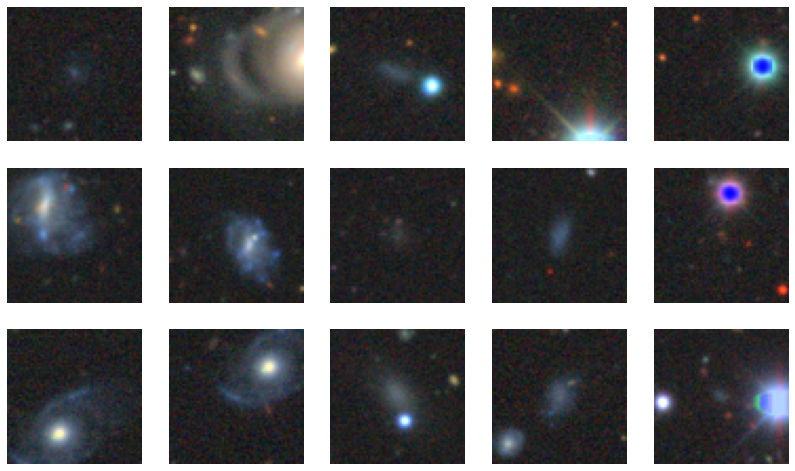

In [133]:
# Plot negatives
cutout_plot(ra_pos_1st_r,dec_pos_1st_r,0,end=15,save=False)

runs: 99


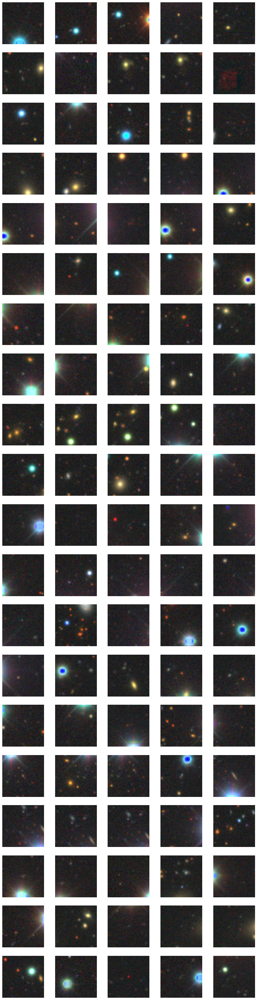

In [135]:
cutout_plot(ra_neg_1st_r,dec_neg_1st_r,0,end=100,save=False)

## II) Second stage classifier

In [47]:
from Y3_training import Feature_Y3

y_labels_2nd, X_feat_2nd = Feature_Y3()

In [48]:
# Split into train-test sets
X_train_2nd, X_test_2nd, y_train_2nd, y_test_2nd = train_test_split(
    X_feat_2nd, y_labels_2nd, train_size = 0.75, random_state = 42)


# Standardize the two sets
scaler = StandardScaler().fit(X_train_2nd)

X_train_2nd = scaler.transform(X_train_2nd)
X_test_2nd = scaler.transform(X_test_2nd)

In [100]:
# Train the classifier here
svc_2nd = SVC(C=100, kernel='rbf', gamma=0.01, probability=True)
svc_2nd.fit(X_train_2nd, y_train_2nd)

# Predict on the test set
y_pred_2nd = svc_2nd.predict_proba(X_test_2nd)

In [101]:
y_pred_2nd_1 = y_pred_2nd[:,1]


y_pred_2nd_bin = np.zeros(len(y_pred_2nd))
y_pred_2nd_bin[y_pred_2nd_1>0.3] = 1.

**Score-recall and score-precision scores**

In [102]:
probs = np.linspace(0.01,0.99,20)
prec_loc = np.zeros(20)
rec_loc = np.zeros(20)
acc_loc = np.zeros(20)

for i in range(20):
    proba_loc = probs[i]
    y_pred_2nd_bin = np.zeros(len(y_pred_2nd))
    y_pred_2nd_bin[y_pred_2nd_1>proba_loc] = 1.
    
    prec_loc[i] = precision_score(y_test_2nd,y_pred_2nd_bin)
    rec_loc[i] = recall_score(y_test_2nd,y_pred_2nd_bin)
    acc_loc[i] = accuracy_score(y_test_2nd,y_pred_2nd_bin)

Make plots

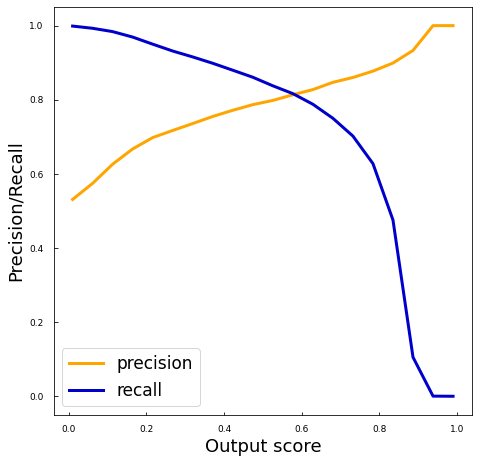

In [110]:
plt.figure(figsize = (7.5,7.5))


plt.plot(probs,prec_loc,color='orange',linewidth=3,label='precision')
plt.plot(probs,rec_loc,color='mediumblue',linewidth=3,label='recall')

plt.xlabel('Output score',fontsize=18)
plt.ylabel('Precision/Recall',fontsize=18)
plt.legend(frameon=True, loc='lower left', fontsize=17)

plt.show()

In [70]:
print(precision_score(y_test_2nd,y_pred_2nd_bin))
print(recall_score(y_test_2nd,y_pred_2nd_bin))
print(accuracy_score(y_test_2nd,y_pred_2nd_bin))

0.8809241706161137
0.5923122883887671
0.7551


Predict on keep

In [89]:
X_keep_2nd = scaler.fit_transform(X_forn_keep)
y_pred_2nd = svc_2nd.predict_proba(X_keep_2nd)[:,1]
print(len(y_pred_2nd[y_pred_2nd>0.3]))

109


Print double positives and negatives

runs: 99


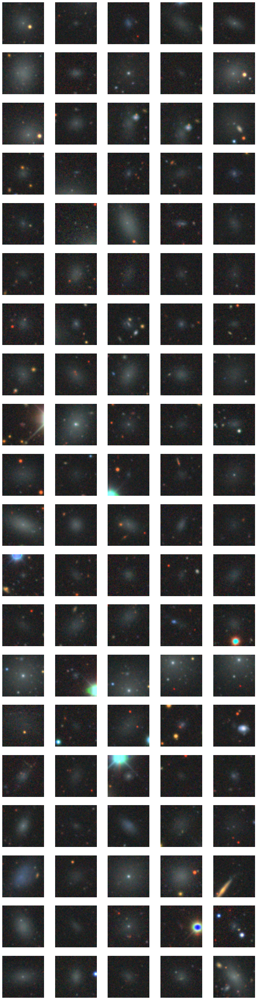

In [91]:
# Plot positives
cutout_plot(ra_pos_1st[y_pred_2nd>0.3],dec_pos_1st[y_pred_2nd>0.3],0,end=100,save=False)

runs: 89


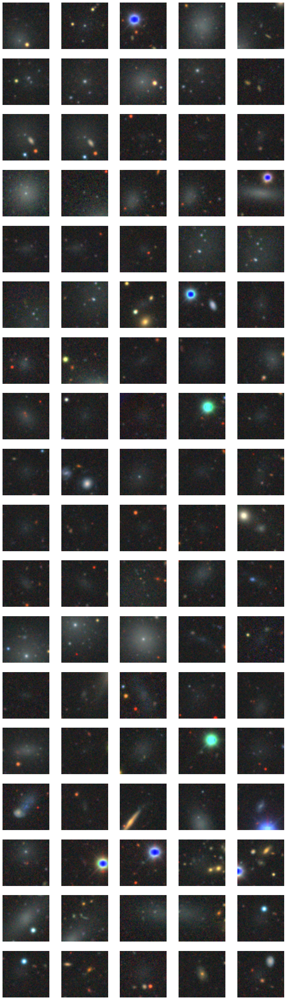

In [55]:
# Plot negatives


runs: 29


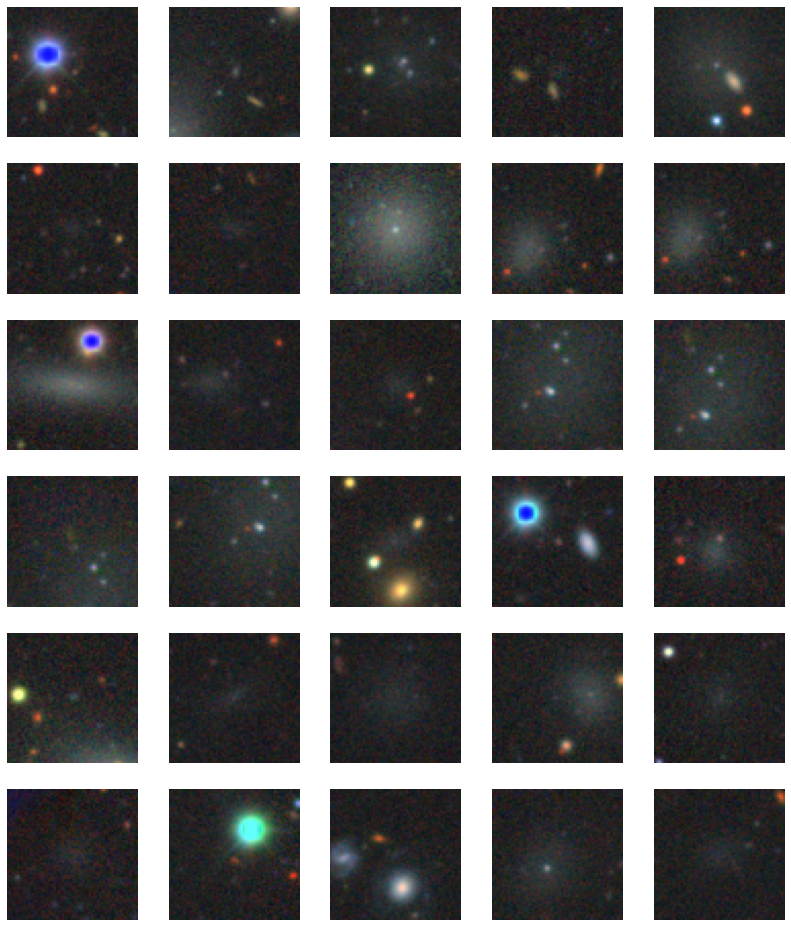

In [94]:
cutout_plot(ra_pos_1st[y_pred_2nd<0.2],dec_pos_1st[y_pred_2nd<0.2],0,end=30,save=False)